In [1]:
# Reference: https://www.pyimagesearch.com/2017/09/11/object-detection-with-deep-learning-and-opencv/

# import the necessary packages
%matplotlib inline

from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
from os import listdir
from os.path import isfile, join

In [2]:
# Initiate ORB detector
orb = cv2.ORB_create() 

mypath = ".\Database"
labels = [f for f in listdir(mypath) if isfile(join(mypath, f))]

database = []
for label in labels:
    img = cv2.imread('.\Database\\' + label,1)
    img = cv2.resize(img, (300, 300))
    kp, des = orb.detectAndCompute(img,None)
    hist = cv2.calcHist([img], [0, 1, 2], None, [16, 16, 16], [0, 256, 0, 256, 0, 256])
    database.append([hist,des,img])
    
labels = [label[:-6] for label in labels]

In [3]:
# Create Matching Function for Image Query to Database
def matching(img, database):
    img = cv2.resize(img, (300, 300))
    kp, des = orb.detectAndCompute(img,None)
    hist = cv2.calcHist([img], [0, 1, 2], None, [16, 16, 16], [0, 256, 0, 256, 0, 256])
    score1 = []
    score2 = []
    score3 = []
    for data in database:
        hist_base = data[0]
        des_base = data[1]
        img_base = data[2]
        # Comparing SIFT features
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des, des_base)
        similar_regions = [i for i in matches if i.distance < 70]
        if len(matches) == 0:
            score1 = 0
        score1.append(len(similar_regions) / len(matches))
        
        # Comparing Color Histogram
        score2.append(cv2.compareHist(hist, hist_base, cv2.HISTCMP_INTERSECT))
    
    score2 = (np.array(score2)-np.mean(score2))/np.std(score2)
    score = list(np.array(score1) + 0.1*score2)
    return labels[score.index(max(score))]

In [4]:
# Create function for OTC detection
def OTC_detection(test_image):
    # initialize the list of class labels MobileNet SSD was trained to
    # detect, then generate a set of bounding box colors for each class
    prototxt = "MobileNetSSD_deploy.prototxt.txt"
    model = "MobileNetSSD_deploy.caffemodel"
    test = test_image
    threshold = 0.2

    CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat", \
               "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person", "pottedplant", "sheep",\
               "sofa", "train", "tvmonitor"]
    COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

    # load our serialized model from disk
    print("[INFO] loading model...")
    net = cv2.dnn.readNetFromCaffe(prototxt, model)

    # load the input image and construct an input blob for the image
    # by resizing to a fixed 300x300 pixels and then normalizing it
    # (note: normalization is done via the authors of the MobileNet SSD
    # implementation)
    image = cv2.imread(test)
    clone = image.copy()
    (h, w) = image.shape[:2]
    blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

    # pass the blob through the network and obtain the detections and
    # predictions
    print("[INFO] computing object detections...")
    net.setInput(blob)
    detections = net.forward()

    # loop over the detections
    for i in np.arange(0, detections.shape[2]):
        # extract the confidence (i.e., probability) associated with the
        # prediction
        confidence = detections[0, 0, i, 2]

        # filter out weak detections by ensuring the `confidence` is
        # greater than the minimum confidence
        if confidence > threshold:
        # extract the index of the class label from the `detections`,
        # then compute the (x, y)-coordinates of the bounding box for
        # the object
            idx = int(detections[0, 0, i, 1])
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")

            # display the detection
            label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
            print("[INFO] {}".format(label))
            cv2.rectangle(image, (startX, startY), (endX, endY),COLORS[idx], 2)
            if startY - 15 > 15:
                y = startY - 15  
            else:
                y = startY + 15
            cv2.putText(image, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLORS[idx], 2)

            # identify query
            crop_img = clone[startY:endY, startX:endX]
            label = matching(crop_img, database)
            print(label)

            plt.figure(figsize=(5,5))
            crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)
            plt.imshow(crop_img)
            plt.show()

    # show the output image
    plt.figure(figsize=(15,15))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.show()

Results for Image B1.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.97%
Walgreens Aspirin 81


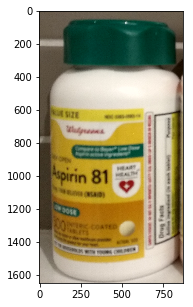

[INFO] bottle: 99.87%
Walgreens Aspirin 325


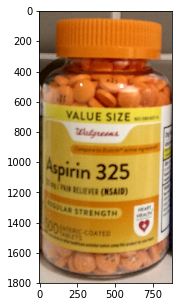

[INFO] bottle: 99.76%
Cystex


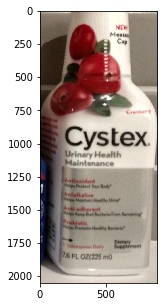

[INFO] bottle: 87.56%
Aleve PM


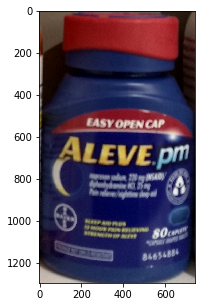

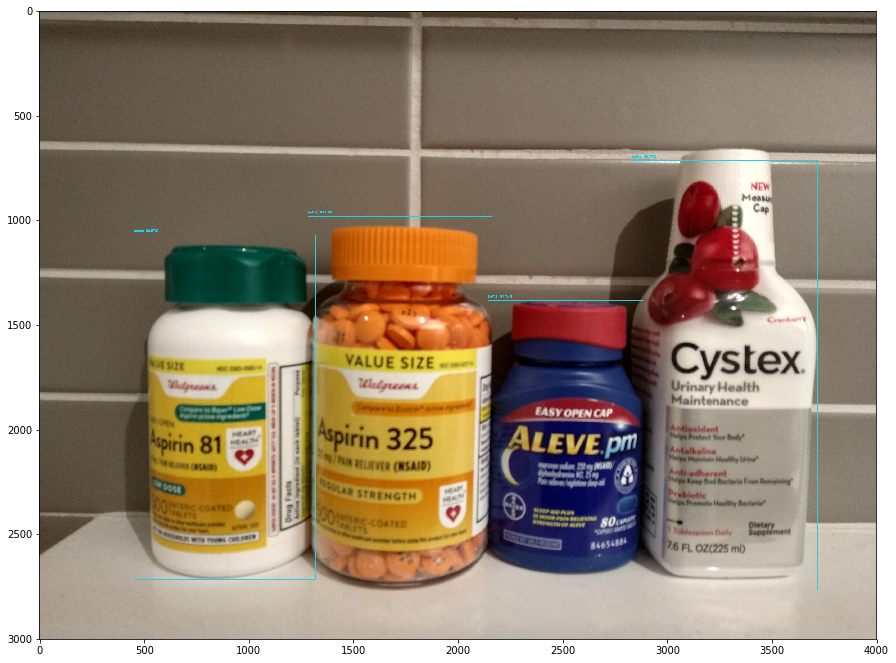

-------------------------------

Results for Image T1.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 98.78%
Cystex


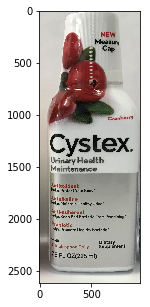

[INFO] bottle: 98.22%
Aleve PM


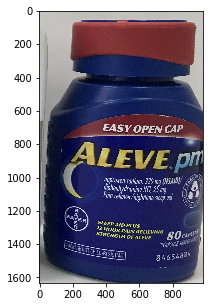

[INFO] bottle: 96.11%
Walgreens Aspirin 81


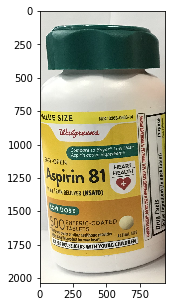

[INFO] bottle: 78.49%
Walgreens Aspirin 325


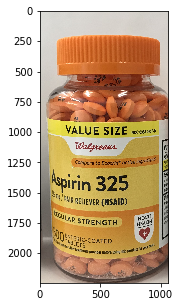

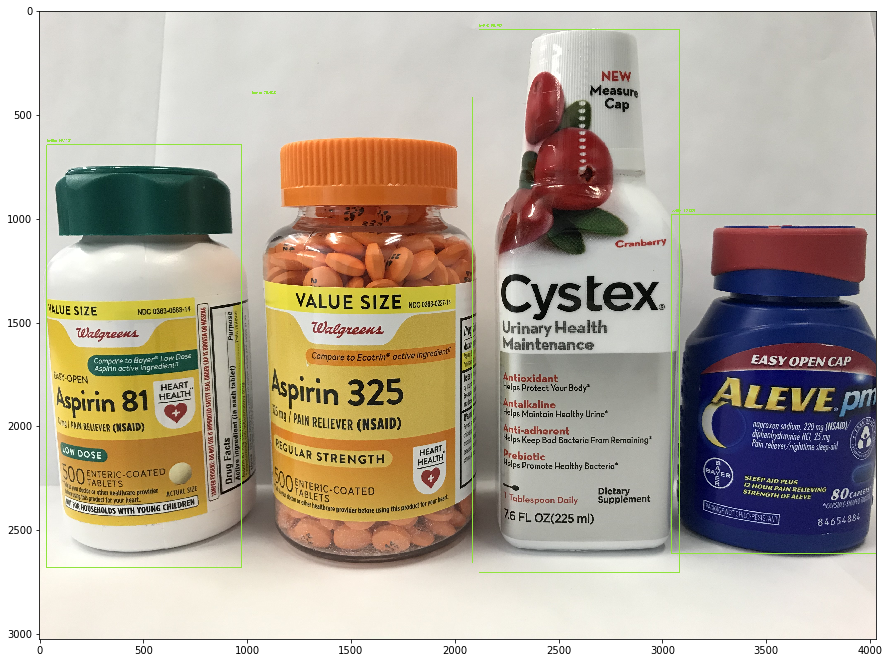

-------------------------------

Results for Image T2.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 98.91%
Cystex


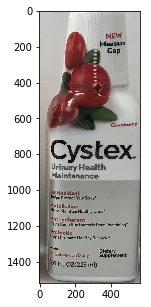

[INFO] bottle: 85.81%
Aleve PM


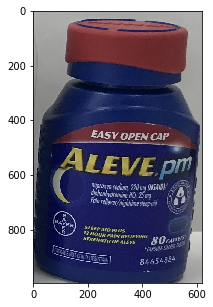

[INFO] bottle: 83.82%
Walgreens Aspirin 81


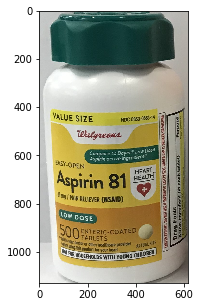

[INFO] bottle: 78.58%
Walgreens Aspirin 325


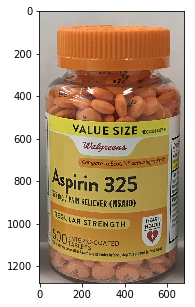

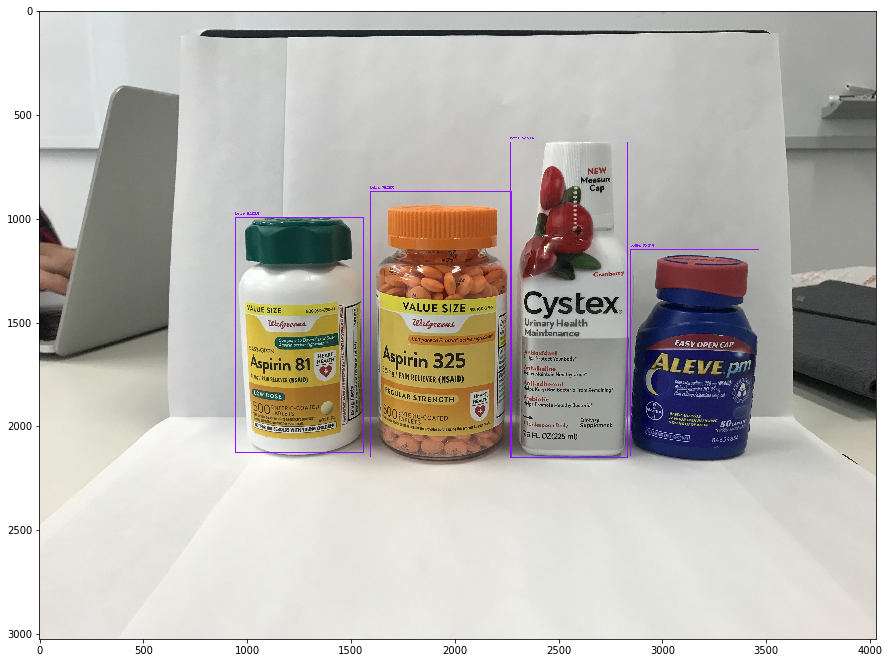

-------------------------------

Results for Image T3.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.94%
Cystex


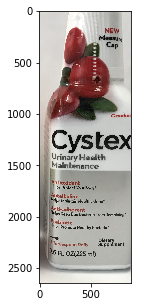

[INFO] bottle: 97.75%
Walgreens Aspirin 81


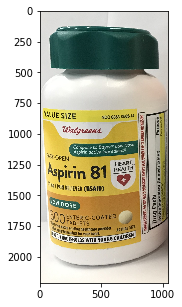

[INFO] bottle: 82.00%
Walgreens Aspirin 325


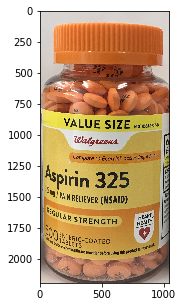

[INFO] bottle: 78.02%
Aleve PM


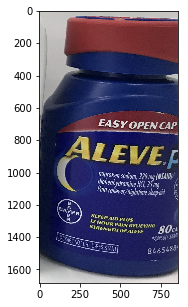

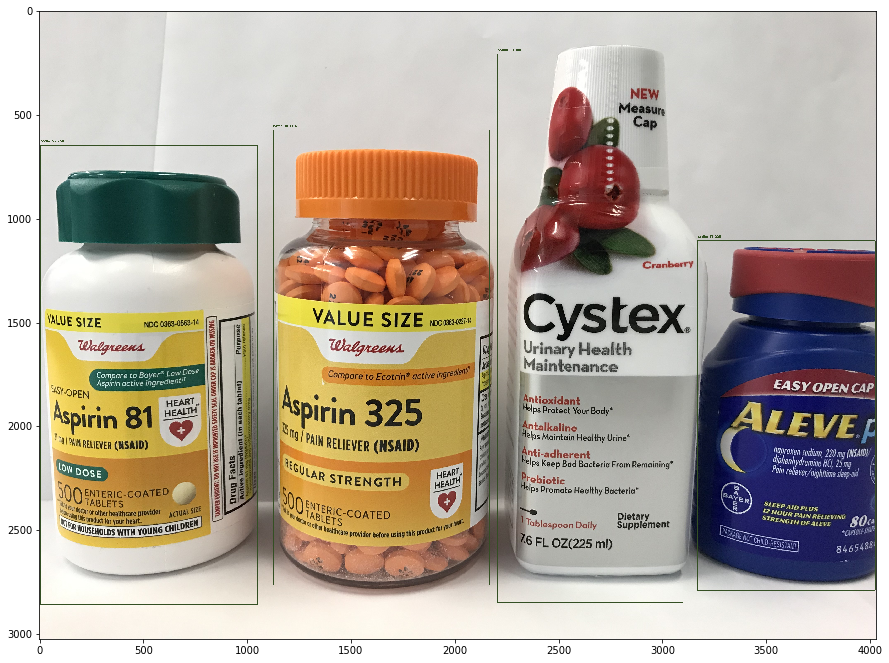

-------------------------------

Results for Image T4.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.23%
Walgreens Aspirin 325


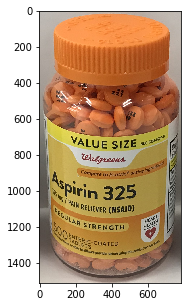

[INFO] bottle: 99.09%
Cystex


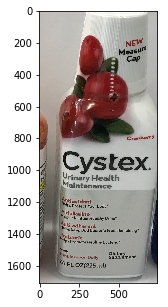

[INFO] bottle: 99.06%
Walgreens Aspirin 81


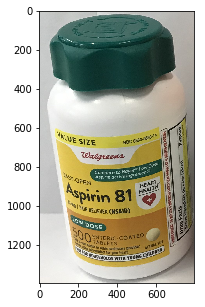

[INFO] bottle: 54.31%
Cystex


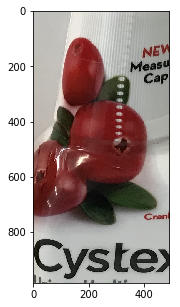

[INFO] bottle: 42.99%
Aleve PM


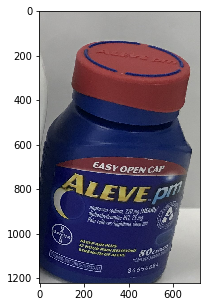

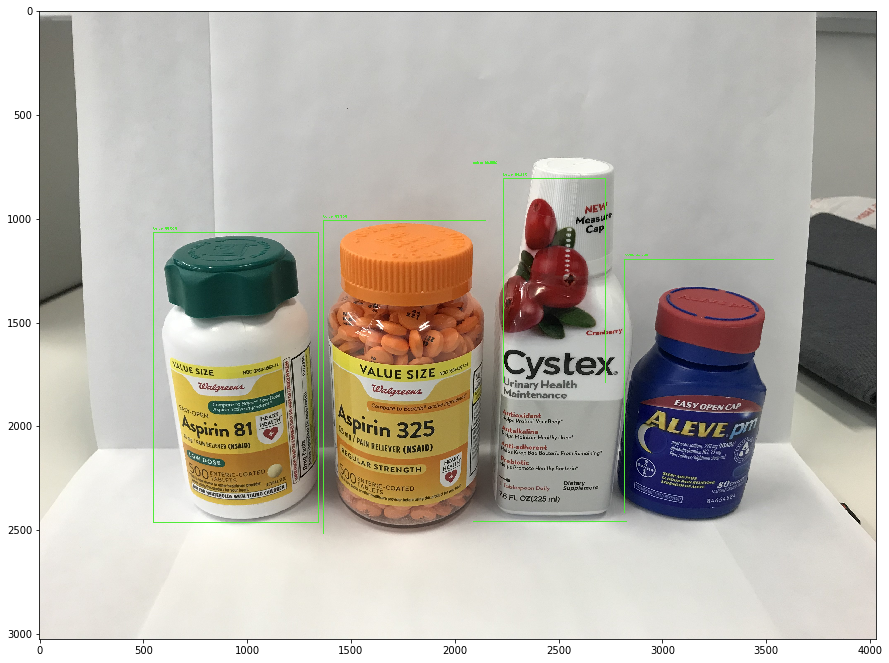

-------------------------------

Results for Image T5.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.89%
Aleve PM


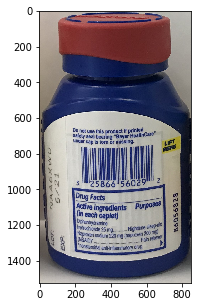

[INFO] bottle: 99.36%
Walgreens Aspirin 325


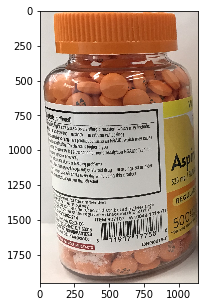

[INFO] bottle: 98.48%
Walgreens Aspirin 81


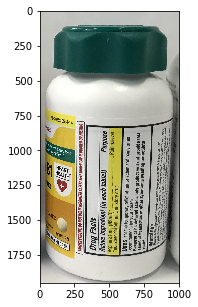

[INFO] bottle: 39.45%
Cystex


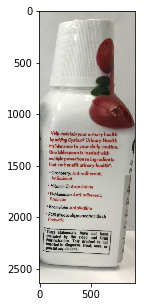

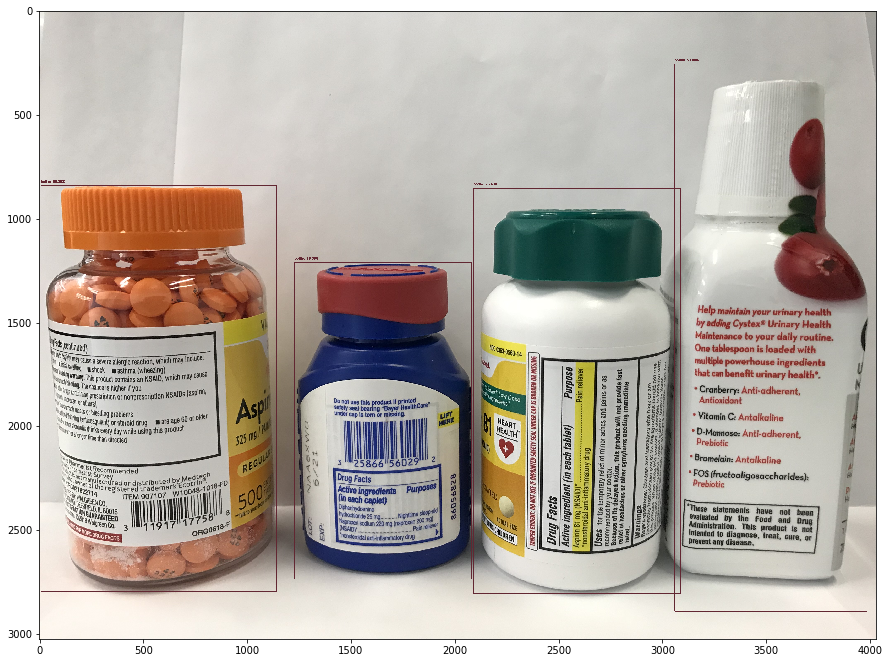

-------------------------------

Results for Image T6.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 98.01%
Walgreens Aspirin 325


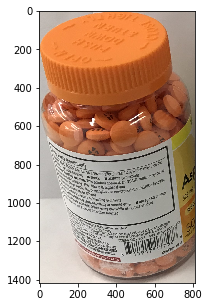

[INFO] bottle: 97.96%
Aleve PM


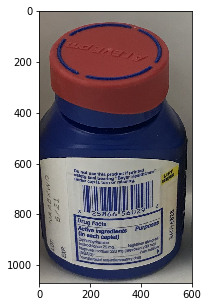

[INFO] bottle: 89.45%
Cystex


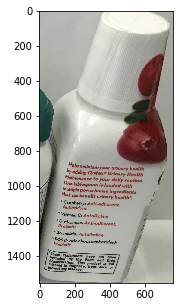

[INFO] bottle: 45.21%
Walgreens Aspirin 81


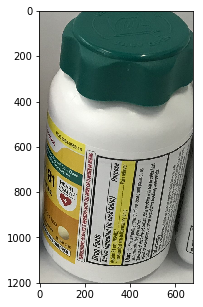

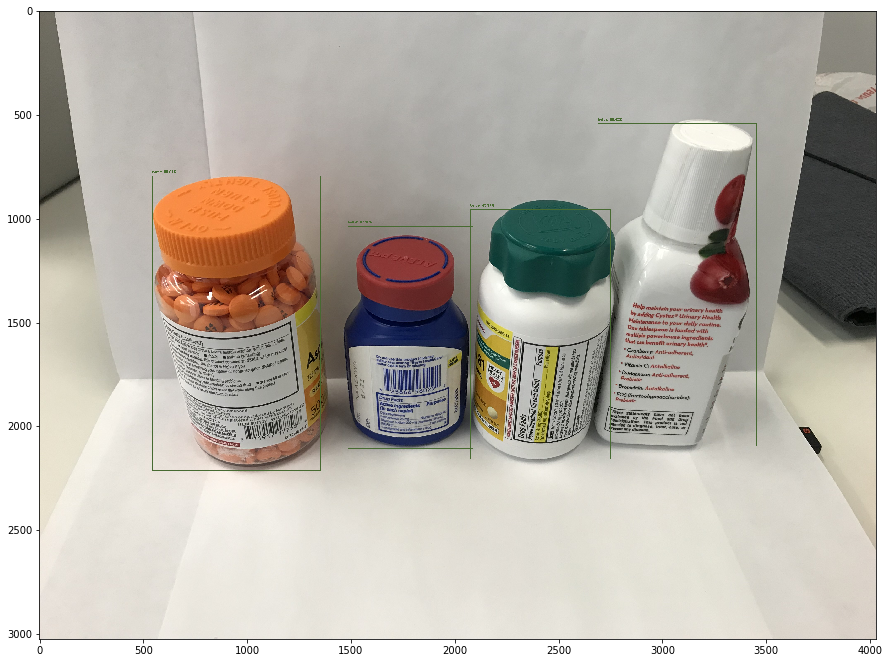

-------------------------------

Results for Image T7.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.59%
Walgreens Aspirin 325


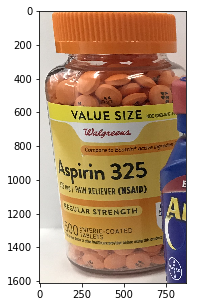

[INFO] bottle: 99.13%
Aleve PM


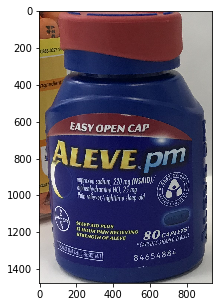

[INFO] bottle: 99.10%
Walgreens Aspirin 81


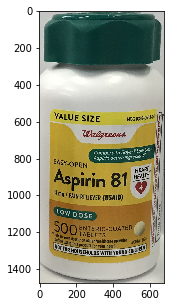

[INFO] bottle: 98.51%
Cystex


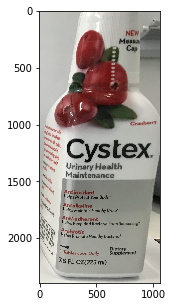

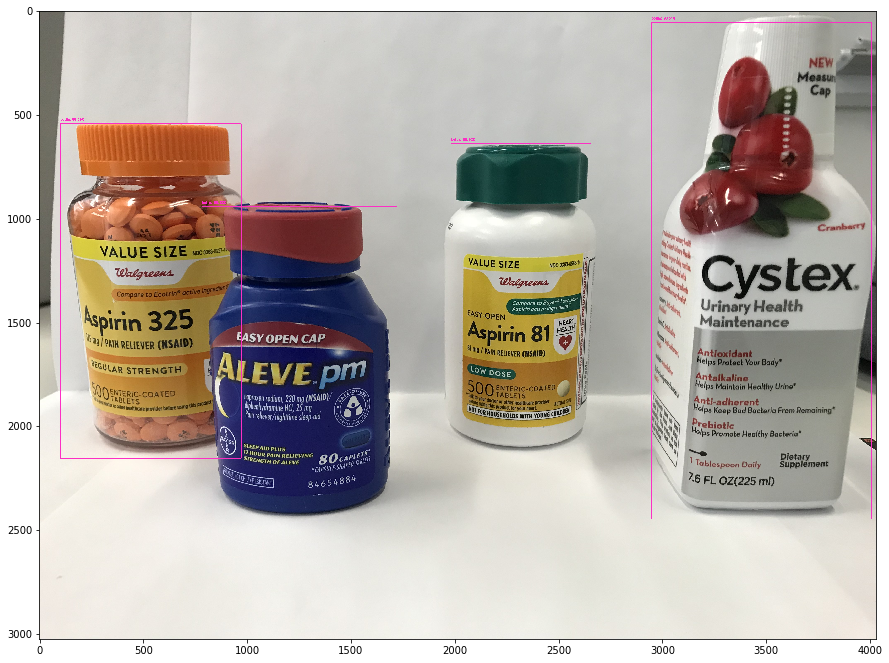

-------------------------------

Results for Image T8.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 98.54%
Cystex


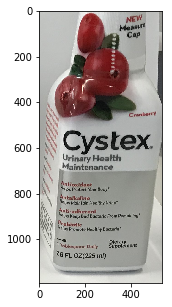

[INFO] bottle: 97.84%
Walgreens Aspirin 81


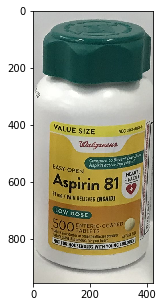

[INFO] bottle: 91.81%
Aleve PM


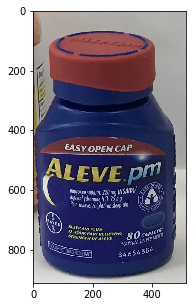

[INFO] bottle: 79.93%
Walgreens Aspirin 325


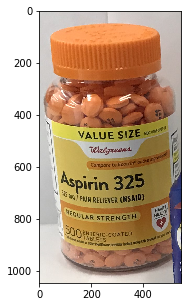

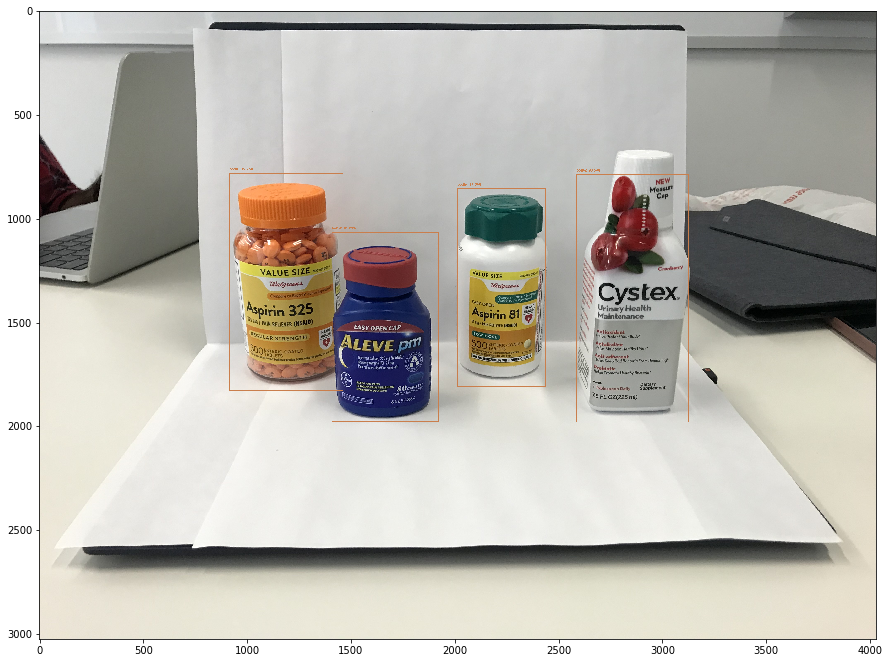

-------------------------------

Results for Image W1.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.99%
Aleve PM


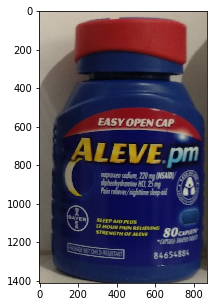

[INFO] bottle: 99.58%
Walgreens Aspirin 325


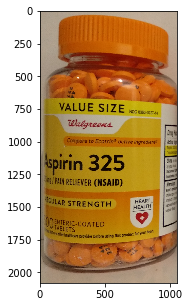

[INFO] bottle: 98.44%
Walgreens Aspirin 81


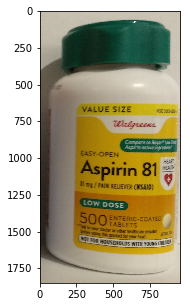

[INFO] bottle: 82.65%
Cystex


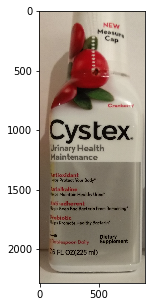

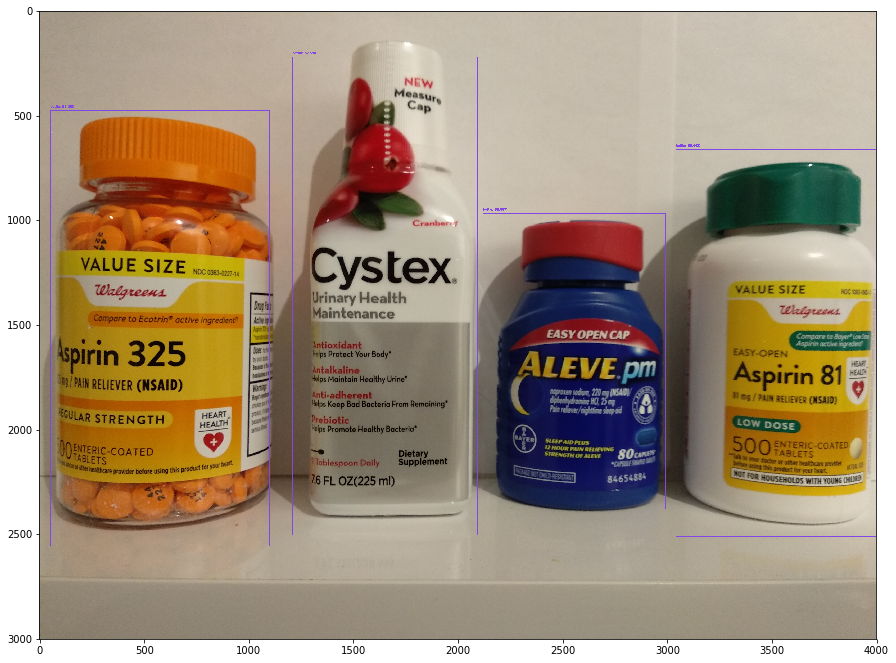

-------------------------------

Results for Image W2.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 100.00%
Aleve PM


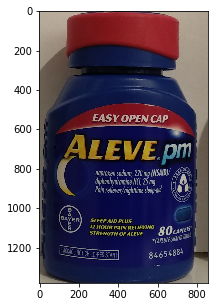

[INFO] bottle: 99.76%
Cystex


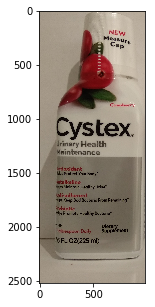

[INFO] bottle: 99.48%
Walgreens Aspirin 81


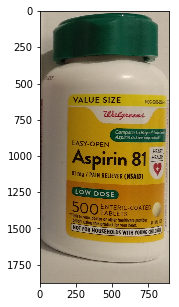

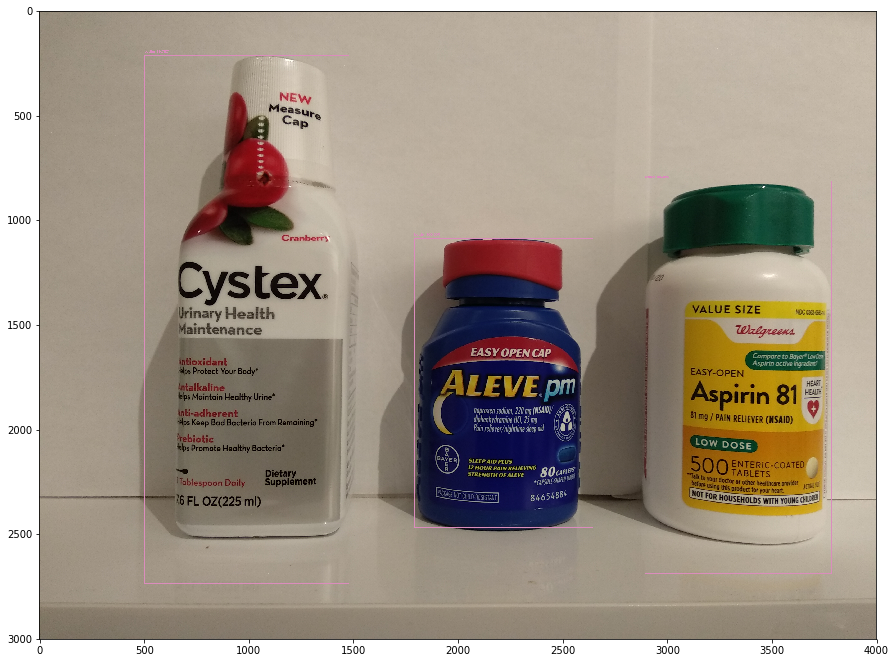

-------------------------------

Results for Image W3.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 100.00%
Aleve PM


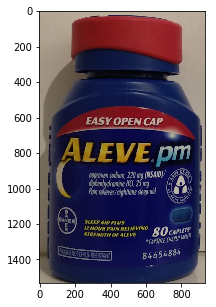

[INFO] bottle: 99.81%
Walgreens Aspirin 81


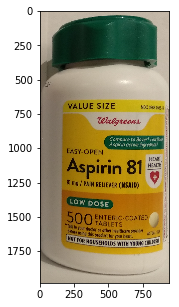

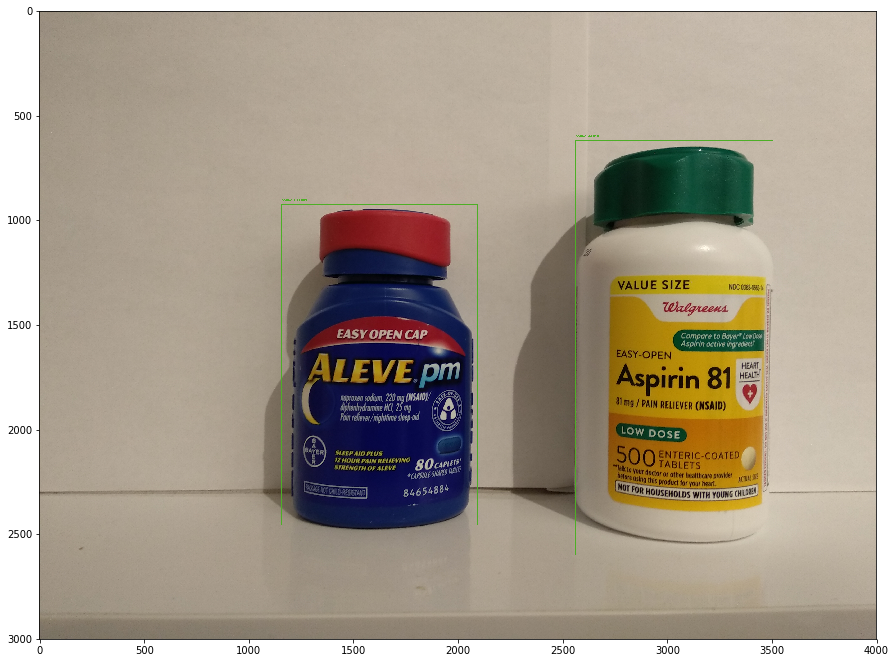

-------------------------------

Results for Image W4.jpg
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 99.90%
Walgreens Aspirin 325


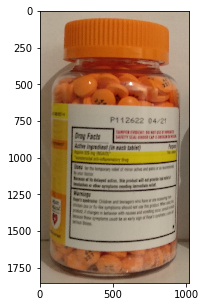

[INFO] bottle: 94.78%
Walgreens Aspirin 81


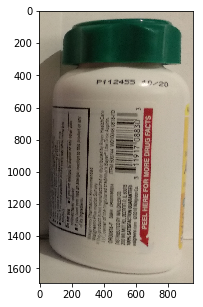

[INFO] bottle: 84.08%
Cystex


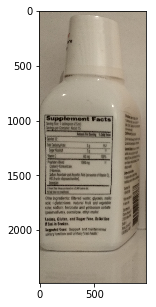

[INFO] bottle: 46.81%
Aleve PM


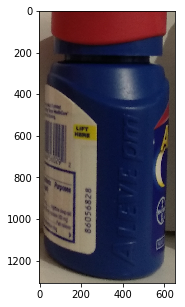

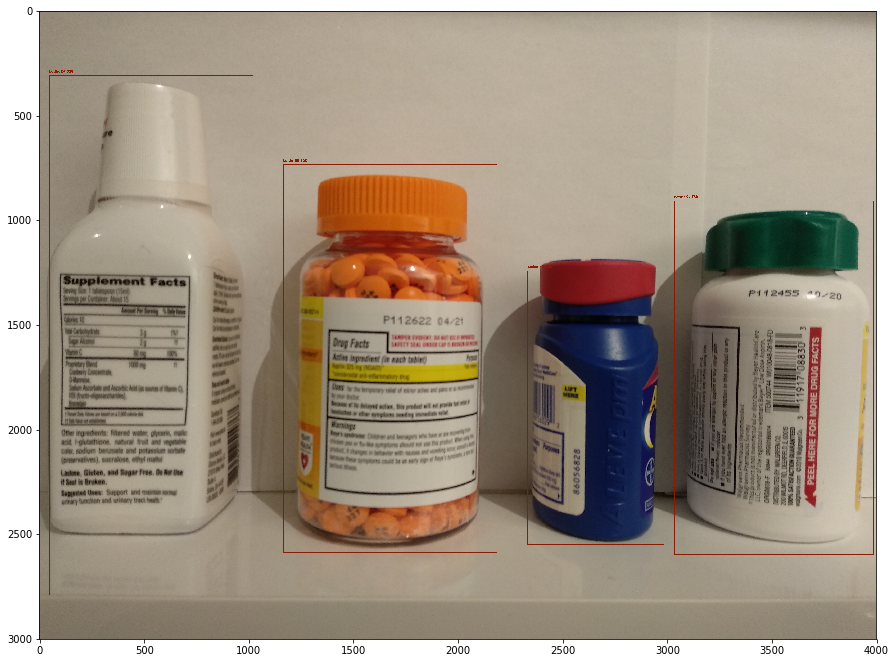

-------------------------------



In [5]:
mypath = ".\Test Images"
test_images = [f for f in listdir(mypath) if isfile(join(mypath, f))]
for test_image in test_images:
    print("Results for Image", test_image)
    test_image = '.\Test Images\\' + test_image
    OTC_detection(test_image)
    print("-------------------------------\n")